In [1]:
import numpy as np
import pandas as pd
import torch
from torch.nn import functional as F
from pytorch_lightning import Trainer
import matplotlib.pyplot as plt
from PIL import Image
from torchvision.utils import make_grid
import torchvision as tv
%matplotlib inline
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [2]:
from dhdrnet.util import ROOT_DIR, DATA_DIR
from dhdrnet.model_lut import DHDRNet

plt.rcParams['figure.figsize'] = (10,10)

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print(device)

def show(img):
    npimg = img.numpy()
    plt.imshow(np.transpose(npimg, (1,2,0)), interpolation='nearest')
    plt.show()

cuda:0


In [11]:
model = DHDRNet.load_from_checkpoint(
    checkpoint_path=ROOT_DIR
    / "dhdrnet"
    / "checkpoints"
    / "dhdr_best.ckpt"
)
model.eval()
trainer = Trainer(gpus="0")
trainer.test(model)

GPU available: True, used: True
No environment variable for node rank defined. Set as 0.
CUDA_VISIBLE_DEVICES: [0]


--------------------------------------------------------------------------------
TEST RESULTS
{'test_loss': tensor(1.7589, device='cuda:0')}
--------------------------------------------------------------------------------



In [13]:
image_names = pd.read_csv(ROOT_DIR/"train.txt", header=None).sample(n=9)

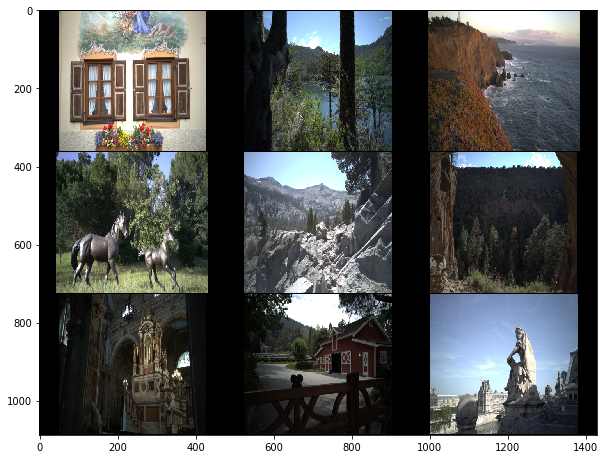

In [14]:
input_images = [
    Image.open(DATA_DIR / "correct_exposures" / "exposures" / f"{name}[0.0].png")
    for name in image_names[0]
]

transforms = tv.transforms.Compose(
    [
        tv.transforms.CenterCrop((360, 474)),  # min dimensions along DS
        tv.transforms.ToTensor(),
    ]
)
image_tensors = torch.stack([transforms(im) for im in input_images])
show(make_grid(image_tensors, nrow=3))

In [15]:
ev_options = np.arange(-3, 6.25, 0.25)

outputs = F.softmax(model(image_tensors.to(device)), dim=1)
_, predictions = torch.max(outputs, 1)
predictions = predictions.to("cpu")
predictions

tensor([25, 28, 25, 24, 25, 25, 28, 28, 27])

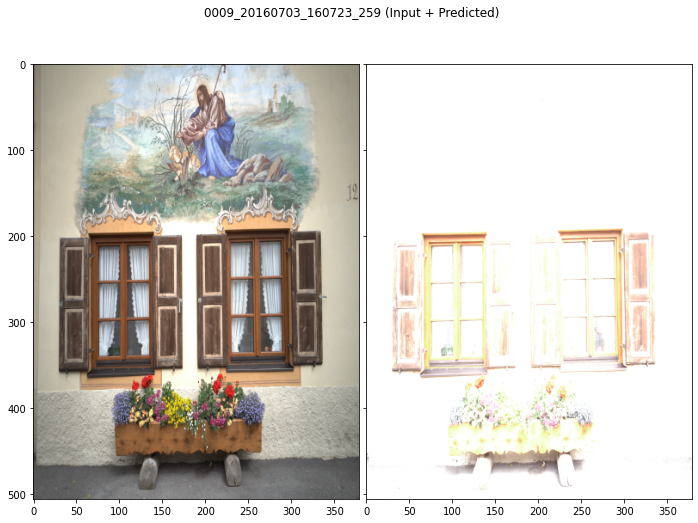

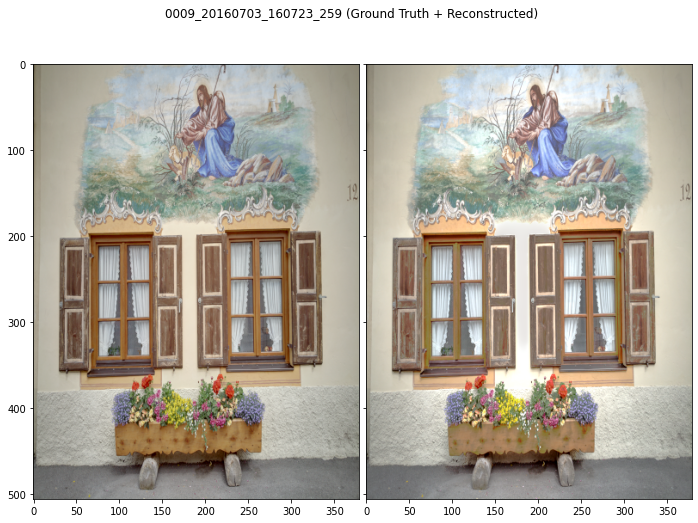

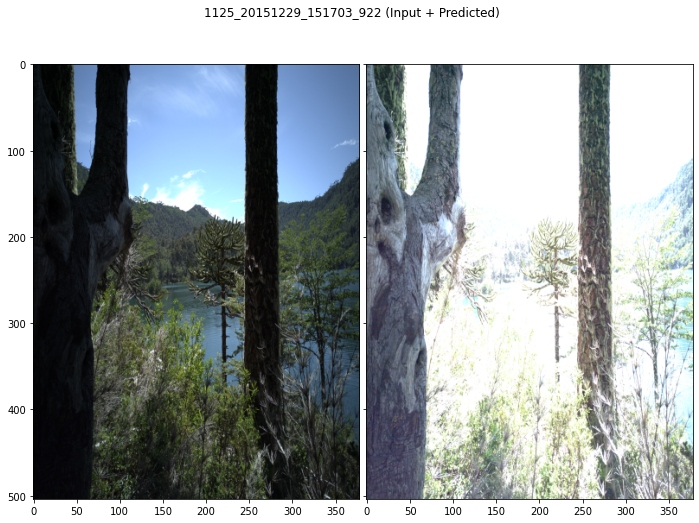

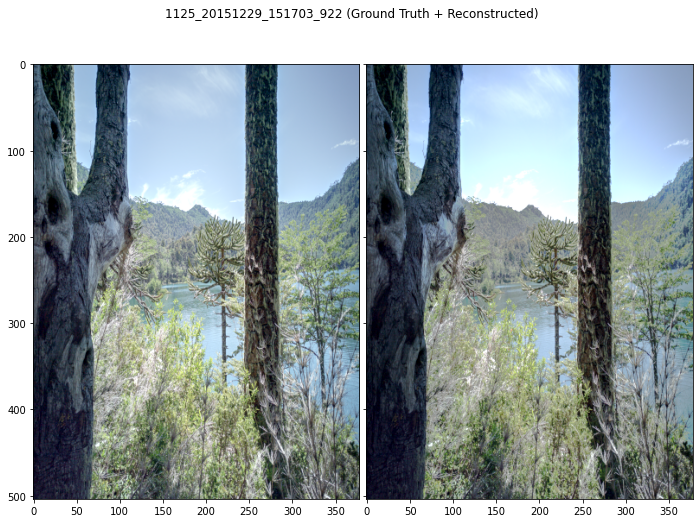

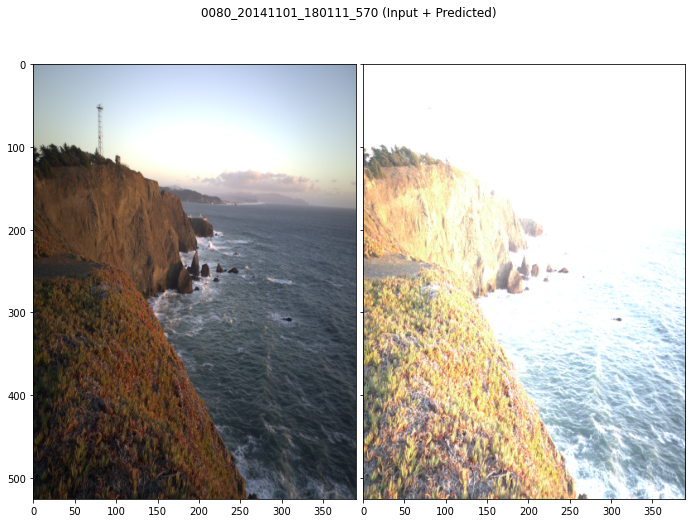

...

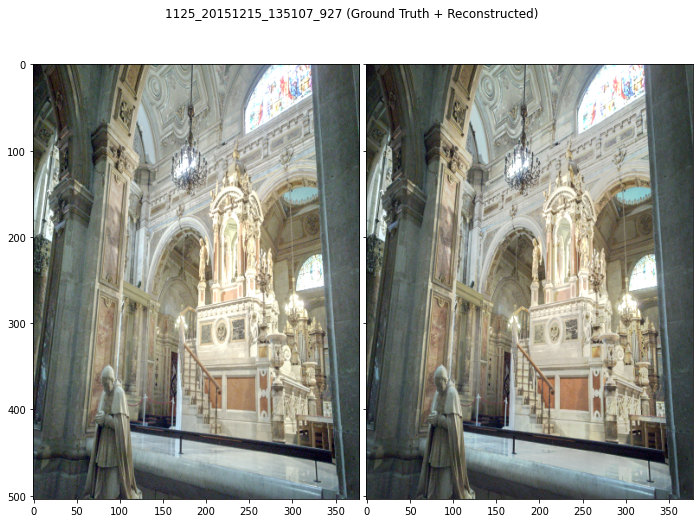

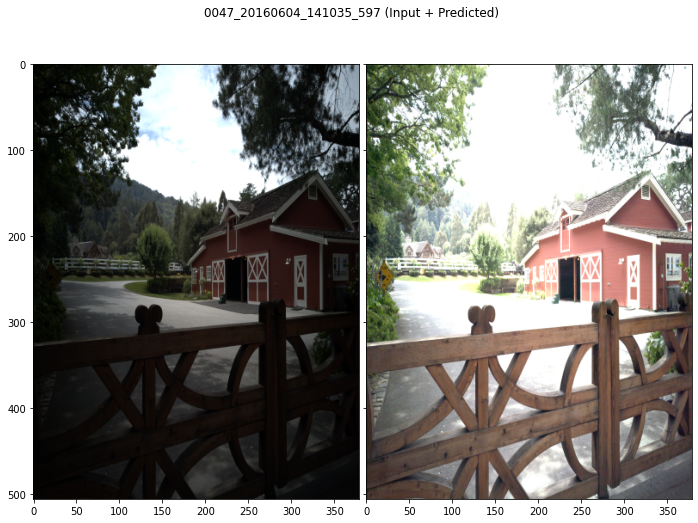

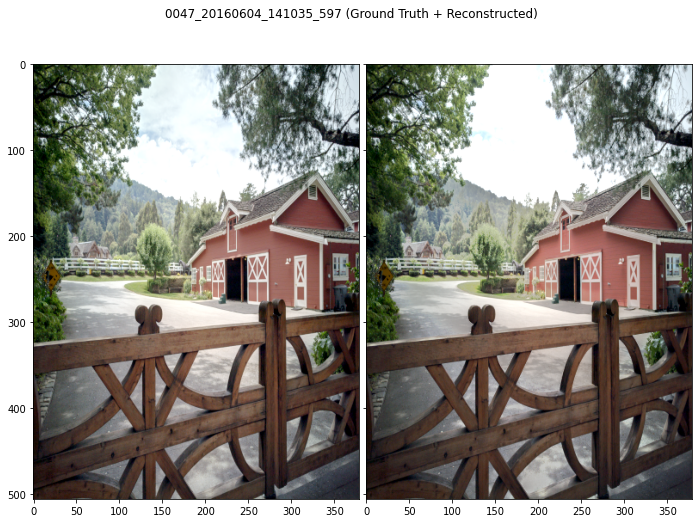

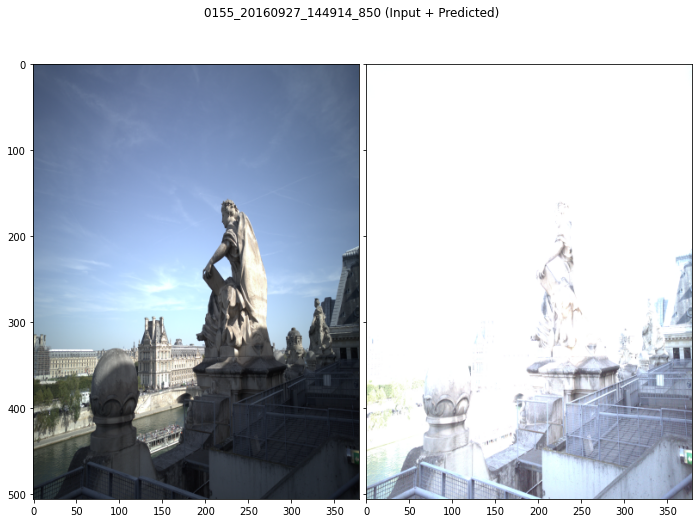

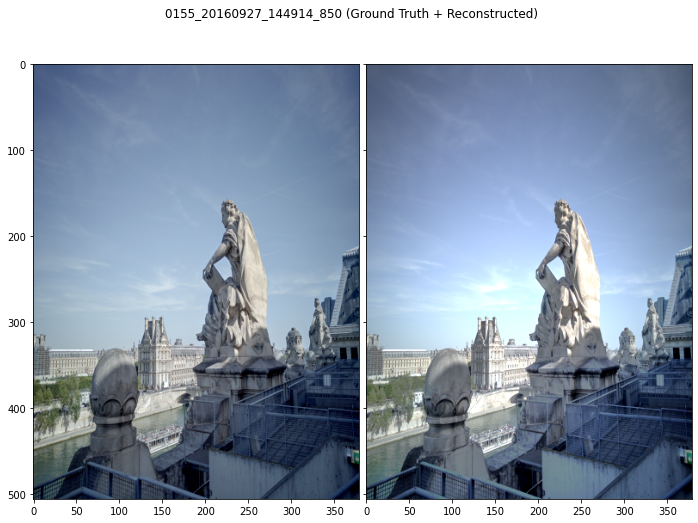

In [16]:
from dhdrnet.vis_util import show_image_pair
    
for pred, img_name in zip(predictions, image_names[0]):
    ev = ev_options[pred]
    pred_img = Image.open(
        DATA_DIR / "correct_exposures" / "exposures" / f"{img_name}[{ev}].png"
    )
    baseline_img = Image.open(
        DATA_DIR / "correct_exposures" / "exposures" / f"{img_name}[0.0].png"
    )
    show_image_pair(baseline_img, pred_img, title=f"{img_name} (Input + Predicted)")
   

    lower = np.minimum(ev, 0.0)
    upper = np.maximum(ev, 0.0)
    reconstructed = Image.open(
        DATA_DIR
        / "correct_exposures"
        / "reconstructions"
        / f"{img_name}[{lower}][{upper}].png"
    )
    ground_truth = Image.open(
        DATA_DIR / "correct_exposures" / "ground_truth" / f"{img_name}.png"
    )
    show_image_pair(
        ground_truth, reconstructed, title=f"{img_name} (Ground Truth + Reconstructed)"
    )
 